In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import (Dense,
                                     BatchNormalization,
                                     LeakyReLU,
                                     Reshape,
                                     Conv2DTranspose,
                                     Conv2D,
                                     Dropout,
                                     Flatten,
                                     Activation)
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image

In [ ]:
def load_and_augment_images(folder_path, class_name,num_augmented=15):
    train_images = []
    datagen = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.1,
    shear_range=0.2,
    horizontal_flip=False,
    vertical_flip=False,
    fill_mode='nearest'
    )


    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(folder_path, filename)
            try:
                image = Image.open(image_path)
                image = image.resize((32, 32))
                image = image.convert('L')
                image_array = np.array(image)

                # Reshape to (height, width, channels) for augmentation
                image_array = image_array.reshape(image_array.shape + (1,))

                augmented_images = []
                for _ in range(num_augmented):
                    augmented_batch = datagen.random_transform(image_array)
                    augmented_images.append(augmented_batch)

                train_images.extend(augmented_images)
            except Exception as e:
                print(f"Could not process image: {image_path}. Error: {e}")

    return np.array(train_images)

In [ ]:
import os
import numpy as np
from PIL import Image

arabic_labels = ['alef', 'beh', 'teh', 'theh', 'jeem', 'hah', 'khah', 'dal', 'thal',
                 'reh', 'zain', 'seen', 'sheen', 'sad', 'dad', 'tah', 'zah', 'ain',
                 'ghain', 'feh', 'qaf', 'kaf', 'lam', 'meem', 'noon', 'heh', 'waw', 'yeh']




def load_images(folder_path,class_name):
    train_images = []


    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(folder_path, filename)
            try:
                image = Image.open(image_path)
                image = image.resize((32,32))
                image = image.convert('L')
                image_array = np.array(image)
                train_images.append(image_array)
            except Exception as e:
                print(f"Could not process image: {image_path}. Error: {e}")

    return np.array(train_images)

In [ ]:
folder_path = '/content/drive/MyDrive/archive/train'
train_images = load_and_augment_images(folder_path,'alef',num_augmented=3)

******************
(40320, 32, 32, 1)


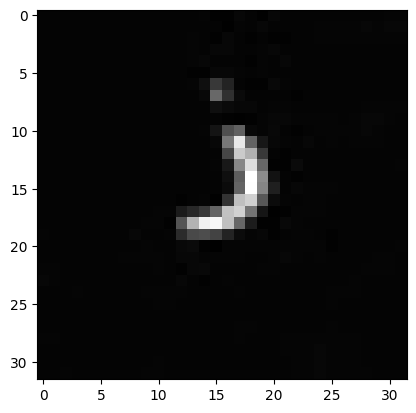

In [ ]:
print('******************')
print(train_images.shape)

random_index = np.random.choice(train_images.shape[0])
plt.imshow(train_images[random_index] , cmap='gray')

In [ ]:
additional_data = load_and_augment_images('/content',num_augmented=1)
print(additional_data.shape)
additional_data_resized = additional_data.reshape((-1,) + train_images.shape[1:])

train_images = np.concatenate((train_images, additional_data_resized), axis=0)

(4091, 32, 32, 1)


(11291, 32, 32, 1)


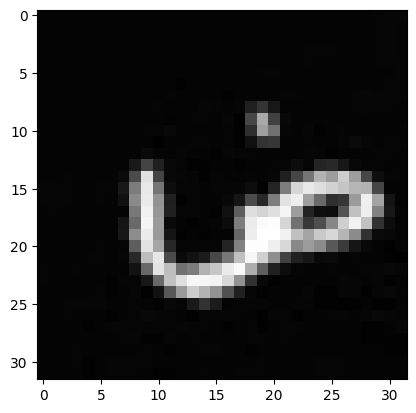

In [ ]:
print(train_images.shape)

random_index = np.random.choice(train_images.shape[0])
plt.imshow(train_images[random_index] , cmap='gray')

In [ ]:
train_images = (train_images - 127.5) / 127.5  #[-1,1]


BUFFER_SIZE = 60000
BATCH_SIZE = 32

data = train_images

train_dataset = tf.data.Dataset.from_tensor_slices(data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

print(train_images.shape)


(40320, 32, 32, 1)


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 8192)              7372800   
                                                                 
 batch_normalization_6 (Batc  (None, 8192)             32768     
 hNormalization)                                                 
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 8192)              0         
                                                                 
 reshape_3 (Reshape)         (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 16, 16, 64)       204800    
 ranspose)                                                       
                                                                 
 batch_normalization_7 (Batc  (None, 16, 16, 64)      

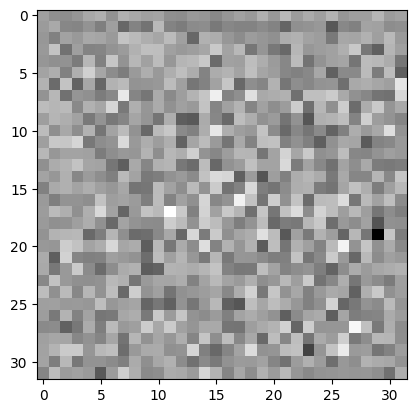

In [ ]:
noise_dim = 900



def generator_model(input_shape=(32, 32, 1)):

    model = tf.keras.Sequential()

    model.add(Dense(8 * 8 * 128, use_bias=False, input_shape=(noise_dim,)))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.1))
    model.add(Reshape((8, 8, 128)))



    model.add(Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.1))

    # الطبقة الثانية من الطبقات المستديرة العكسية: 1 filter (حجم الصورة 16x16)
    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    assert model.output_shape == (None , 32, 32, 1)  # التحقق من حجم الإخراج النهائي

    print(model.summary())
    return model

generator = generator_model()



# Create a random noise and generate a sample
noise = tf.random.normal([1, noise_dim])
generated_image = generator(noise, training=False)
plt.imshow(generated_image[0, :, :, 0], cmap='gray')

# Discriminator Model
def discriminator_model():
    model = tf.keras.Sequential()

    model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32,32, 1]))
    model.add(LeakyReLU(alpha=0.1))
    model.add(Dropout(0.3))

    model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.1))
    model.add(Dropout(0.3))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    print(model.summary())
    return model

discriminator = discriminator_model()


In [ ]:
# Loss Functions
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
@tf.function
def train_step(images):
    # Generate noise
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    # Generator training
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


In [ ]:
# Training Loop
EPOCHS = 40
num_examples_to_generate = 49
seed = tf.random.normal([num_examples_to_generate, noise_dim])

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(7, 7))

    for i in range(predictions.shape[0]):
        plt.subplot(7, 7, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    plt.subplots_adjust(wspace=0.5)
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()


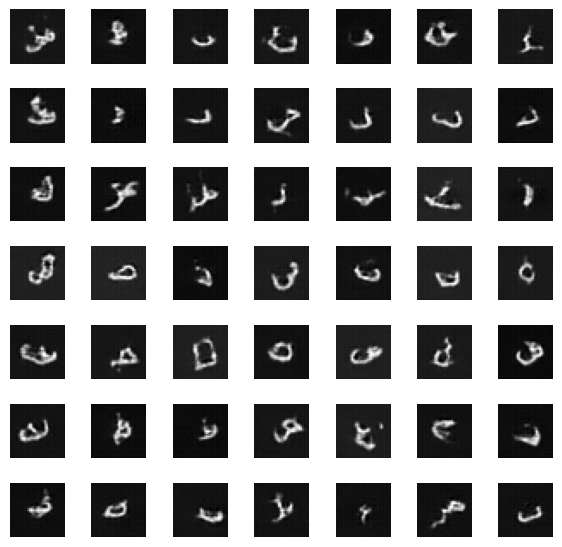

In [ ]:
import time
from IPython import display


checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        for image_batch in dataset:
            train_step(image_batch)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, seed)

        if (epoch + 1) % 5 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

    display.clear_output(wait=True)
    generate_and_save_images(generator, epochs, seed)



train(train_dataset, EPOCHS)

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

<ipython-input-315-1099f26e135d>:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


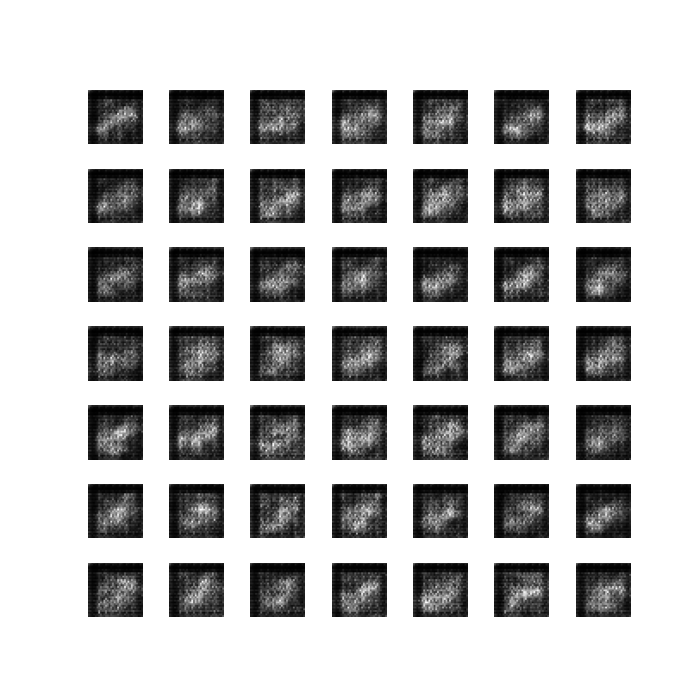

In [ ]:


import glob
import imageio

anim_file = 'dcgan.gif'
with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('image*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

display.Image(open('dcgan.gif','rb').read())

In [ ]:
print(train_images.shape)